<a href="https://colab.research.google.com/github/mateusmouta/Viafind/blob/main/Viafind.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

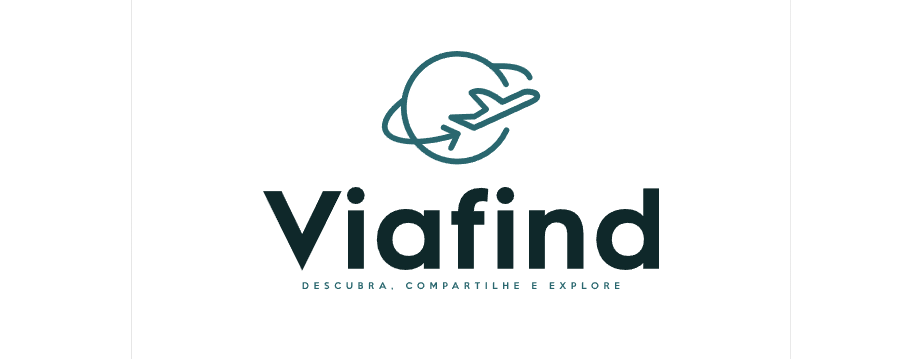











# *   [**logo** ](https://looka.com/s/128220129)
# *   [**Carta de apresentação**](https://docs.google.com/document/d/15sz-gpoCezHDB7heejFgAFcfy--lsnxrYgc9wqOXNVA/edit?usp=sharing)
# *   [**Termo de Abertura do Projeto**](https://docs.google.com/document/d/1TcpdEYWlZrhnM4bipSwgHzGEjkIoeTOkml6qFmYaB8Q/edit?usp=sharing)
# *   [**Documentação**](https://docs.google.com/document/d/10NUizMlfd5DIHsE8VHhvl2eKd8g4xwoSuGT8tZ1ri2o/edit?usp=sharing)
# *   [**Banner apresentação**](https://docs.google.com/presentation/d/1FZf4IAnR9wSECT5W07o99CFraiQh7Yx70IGcngjsX24/edit?usp=sharing)


In [ ]:
!pip install pyspark

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 310.8/310.8 MB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.4.0-py2.py3-none-any.whl size=311317130 sha256=1f9000f45281ece03f32bec110e310df5b29ca3b2a5f472c1edafa0c40c5a2b2
  Stored in directory: /root/.cache/pip/wheels/7b/1b/4b/3363a1d04368e7ff0d408e57ff57966fcdf00583774e761327
Successfully built pyspark


In [ ]:
import pandas as pd
from pyspark.sql import SparkSession

In [ ]:
spark = SparkSession.builder.appName('Read xlsx file from local').getOrCreate()


## [**GOV Mapa do turismo Brasil 2019-2021**](https://dados.gov.br/dados/conjuntos-dados/mapa-do-turismo-brasileiro)

In [ ]:
file_name = 'relatorio_mapa_2019_layout_mkt.xlsx'

In [ ]:
pandas_df = pd.read_excel(file_name)

In [ ]:
spark_df = spark.createDataFrame(pandas_df)

In [ ]:
spark_df.show()

+------------+---+--------------------+--------------------+-------+
|       MACRO| UF|    REGIAO_TURISTICA|           MUNICIPIO|CLUSTER|
+------------+---+--------------------+--------------------+-------+
|Centro-Oeste| MT|Região Turística ...|          Nova Mutum|      C|
|    Nordeste| MA|Polo Lagos e Camp...|             Cajapió|      D|
|     Sudeste| MG|Caminhos da Manti...|          Brazópolis|      D|
|     Sudeste| MG|                Ouro|               Caeté|      B|
|     Sudeste| MG|    Pedras Preciosas|              Catuji|      D|
|     Sudeste| MG| Trilhas do Rio Doce|   Dores de Guanhães|      D|
|     Sudeste| MG| Trilhas do Rio Doce|         José Raydan|      D|
|     Sudeste| SP|Região Turística ...|        Pirassununga|      C|
|     Sudeste| SP|Entre Rios, Serra...|São João da Boa V...|      C|
|     Sudeste| SP| Circuito das Frutas|            Valinhos|      C|
|     Sudeste| SP|ABC Tur - Rota da...|      Ribeirão Pires|      C|
|       Norte| TO|Vale dos Grandes

In [ ]:
filtered_df = spark_df.filter((spark_df['UF'] == 'CE') & (spark_df['CLUSTER'] == 'E'))

In [ ]:
filtered_df.show()

+--------+---+----------------+-----------------+-------+
|   MACRO| UF|REGIAO_TURISTICA|        MUNICIPIO|CLUSTER|
+--------+---+----------------+-----------------+-------+
|Nordeste| CE|   LITORAL LESTE|       Chorozinho|      E|
|Nordeste| CE|          Cariri|      Nova Olinda|      E|
|Nordeste| CE|  Sertão Central|        Tejuçuoca|      E|
|Nordeste| CE|          Cariri|Santana do Cariri|      E|
+--------+---+----------------+-----------------+-------+



In [ ]:
!pip install geopandas
!pip install --upgrade fiona
!pip install descartes

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import requests
import zipfile
import io

In [ ]:
url = 'https://geoftp.ibge.gov.br/organizacao_do_territorio/malhas_territoriais/malhas_municipais/municipio_2022/Brasil/BR/BR_Municipios_2022.zip'
r = requests.get(url)
z = zipfile.ZipFile(io.BytesIO(r.content))
z.extractall()


In [ ]:
brazil = gpd.read_file('BR_Municipios_2022.shp')


In [ ]:
print(brazil.columns)

Index(['CD_MUN', 'NM_MUN', 'SIGLA_UF', 'AREA_KM2', 'geometry'], dtype='object')


In [ ]:
ceara = brazil[brazil['SIGLA_UF'] == 'CE']

In [ ]:
municipios = ["Chorozinho", "Nova Olinda", "Tejuçuoca", "Santana do Cariri"]
ceara_municipios = ceara[ceara['NM_MUN'].isin(municipios)]

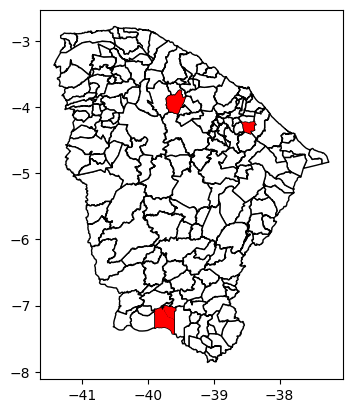

In [ ]:
fig, ax = plt.subplots()
ceara.plot(ax=ax, color='white', edgecolor='black')
ceara_municipios.plot(ax=ax, color='red')
plt.show()

In [ ]:
!pip install googlemaps
!pip install osmnx
!pip install --upgrade osmnx

In [ ]:
import googlemaps

In [ ]:
import osmnx as ox
import networkx as nx
import folium

place_names = ['Chorozinho, CE', 'Nova Olinda, CE', 'Tejuçuoca, CE', 'Santana do Cariri, CE']

graphs = [ox.graph_from_place(place_name, network_type='all') for place_name in place_names]

graph = nx.compose_all(graphs)

gdf = ox.graph_to_gdfs(graph, nodes=False, edges=True)

trails = gdf[gdf["highway"] == "path"]

m = ox.plot_graph_folium(graph, popup_attribute='name', edge_width=2)

for _, trail in trails.iterrows():
    pl = folium.PolyLine(
        locations=[(lat, lon) for lon, lat in trail.geometry.coords],
        color='blue',
        weight=5
    )
    pl.add_to(m)
m

In [ ]:
import googlemaps
import folium

api_key = '####'

# Crie uma instância do cliente do Google Maps
gmaps = googlemaps.Client(key=api_key)

# Localização de Fortaleza
municipios = ['Chorozinho, CE', 'Nova Olinda, CE', 'Tejuçuoca, CE', 'Santana do Cariri, CE']

# Cria um mapa
m = folium.Map(location=[-5.4983977,-39.3206241], zoom_start=7)

# Realize a consulta de lugares próximos em cada município
for municipio in municipios:
    # Obtenha as coordenadas geográficas do município
    geocode_result = gmaps.geocode(municipio)
    location = geocode_result[0]['geometry']['location']
    print(f"Resultados em {municipio}:")

    # Realize a consulta de lugares próximos
    places = gmaps.places_nearby(location=location, radius=5000, type='tourist_attraction')

    # Imprima os resultados e adicione marcadores ao mapa
    for place in places['results']:
        print(place['name'], place['geometry']['location'])
        folium.Marker(
            location=[place['geometry']['location']['lat'], place['geometry']['location']['lng']],
            popup=place['name']
        ).add_to(m)

    print('\n')

# Exibe o mapa
m

Resultados em Chorozinho, CE:
Praça Meninos de Deus {'lat': -4.297760499999999, 'lng': -38.4997324}
Rio Choró {'lat': -4.303630399999999, 'lng': -38.4977324}
Cataratas do Gláucio {'lat': -4.2952572, 'lng': -38.52683219999999}


Resultados em Nova Olinda, CE:
Leather Cycle Museum (Espedito Saddler) {'lat': -7.091701800000002, 'lng': -39.67949559999999}
Eu Amo Nova Olinda {'lat': -7.093505599999999, 'lng': -39.679016}
Pórtico na entrada da cidade {'lat': -7.0881022, 'lng': -39.7022518}
Geossítio Pedra Cariri {'lat': -7.121421100000001, 'lng': -39.6951478}


Resultados em Tejuçuoca, CE:
Estátua de São Pedro {'lat': -3.985770399999999, 'lng': -39.5784392}


Resultados em Santana do Cariri, CE:
Museu de Paleontologia Plácido Cidade Nuvens {'lat': -7.186189199999999, 'lng': -39.7364042}
Geossítio Pontal de Santa Cruz {'lat': -7.210375300000002, 'lng': -39.73379429999999}
Praça Nossa Senhora Santana {'lat': -7.183373400000001, 'lng': -39.7384751}
Caminhos de Benigna {'lat': -7.182254499999999

In [ ]:
import googlemaps
import folium

api_key = '####'

# Crie uma instância do cliente do Google Maps
gmaps = googlemaps.Client(key=api_key)

# Localização de Fortaleza
municipios = ['Chorozinho, CE', 'Nova Olinda, CE', 'Tejuçuoca, CE', 'Santana do Cariri, CE']

# Cria um mapa
m = folium.Map(location=[-5.4983977,-39.3206241], zoom_start=7)

# Realize a consulta de lugares próximos em cada município
for municipio in municipios:
    # Obtenha as coordenadas geográficas do município
    geocode_result = gmaps.geocode(municipio)
    location = geocode_result[0]['geometry']['location']
    print(f"Resultados em {municipio}:")

    # Realize a consulta de lugares próximos
    places = gmaps.places_nearby(location=location, radius=5000, type='lodging')

    # Imprima os resultados e adicione marcadores ao mapa
    for place in places['results']:
        print(place['name'], place['geometry']['location'])
        folium.Marker(
            location=[place['geometry']['location']['lat'], place['geometry']['location']['lng']],
            popup=place['name']
        ).add_to(m)

    print('\n')

# Exibe o mapa
m

Resultados em Chorozinho, CE:
Lá D.Lucas {'lat': -4.287468099999999, 'lng': -38.5060788}
Pantanal Churrascaria & Pousada {'lat': -4.3325834, 'lng': -38.4811345}
Casa seu Marcio campeste {'lat': -4.264845, 'lng': -38.515319}
CHURRASCARIA E POUSADA TRIÂNGULO {'lat': -4.3348863, 'lng': -38.4796884}
Nuage Motel {'lat': -4.258537899999999, 'lng': -38.48679569999999}


Resultados em Nova Olinda, CE:
Pousadas {'lat': -7.092825200000001, 'lng': -39.67996359999999}
Rede de Pousadas {'lat': -7.091228099999999, 'lng': -39.680618}
Pousada Bela Vista {'lat': -7.0941555, 'lng': -39.6793906}
Pousada caldas {'lat': -7.091925, 'lng': -39.68233499999999}
Pousada caldas {'lat': -7.0910011, 'lng': -39.6835883}
Pousada Domicilar Dona Toinha Marota {'lat': -7.089360399999999, 'lng': -39.6831422}
Gdfghhgx {'lat': -7.096515599999999, 'lng': -39.6821102}
Pedra do leao quebrada 33 {'lat': -7.094635800000001, 'lng': -39.6737639}
Charles Motel {'lat': -7.089392900000001, 'lng': -39.7175933}


Resultados em Tejuçu

In [ ]:
import requests

# Define a URL da API
url = 'https://api.yelp.com/v3/businesses/search'

# Define o cabeçalho da requisição
headers = {
    'Authorization': 'Bearer ####',
}

# Define os parâmetros da requisição
params = {
    'location': '',
    'categories': 'restaurants',
    'sort_by': 'rating'
}

locations = ['Chorozinho, CE', 'Nova Olinda, CE', 'Tejuçuoca, CE', 'Santana do Cariri, CE']

for location in locations:
    params['location'] = location

    # Faz a requisição à API
    response = requests.get(url, headers=headers, params=params)

    # Verifica se a resposta da API foi bem sucedida
    if response.status_code != 200:
        print(f"Não foi possível obter informações da Yelp Fusion API para {location}.")
        continue

    # Obtém os resultados da API
    results = response.json()['businesses']

    # Imprime os nomes dos restaurantes e suas respectivas classificações
    print(f"Restaurantes em {location}:")
    for result in results:
        print(f"{result['name']} - Classificação: {result['rating']}")

Restaurantes em Chorozinho, CE:
L'ô Restaurante - Classificação: 5.0
Pasto & Pizza - Classificação: 5.0
Fest Pizza Delivery - Classificação: 5.0
Monte Carlo - Classificação: 5.0
Porpino Burger - Classificação: 5.0
La Raclette - Classificação: 4.5
Pizza Geppos Restaurantes e Turismo - Classificação: 4.5
Misaki - Classificação: 4.5
La Pasta Gialla - Classificação: 4.5
Vignoli - Classificação: 5.0
Alpendre da Vila Bar e Restaurante - Classificação: 5.0
Balcony Bistro - Classificação: 5.0
Le Marche - Classificação: 5.0
Vignoli - Classificação: 5.0
Comida Caseira - Classificação: 5.0
Casa do Frango Sushibar - Classificação: 4.5
Amélie Restô - Classificação: 4.5
Marcel Restaurante - Classificação: 4.5
Empório Brownie - Classificação: 4.5
Goya Sushi Bar - Classificação: 4.5
Restaurantes em Nova Olinda, CE:
Nova Opção Grill - Classificação: 5.0
Restaurante Ondas do Mar - Classificação: 4.0
Restaurantes em Tejuçuoca, CE:
Restaurante Sabor da Terra - Classificação: 5.0
Pizza & Cia - Classificaçã

In [ ]:
import requests
API_KEY = "####"
cidades = ["Chorozinho", "Nova Olinda", "Tejuçuoca", "Santana do Cariri"]
for cidade in cidades:
    link = f"https://api.openweathermap.org/data/2.5/weather?q={cidade}&appid={API_KEY}&lang=pt_br"
    requisicao = requests.get(link)
    requisicao_dic = requisicao.json()
    if 'weather' in requisicao_dic:
        descricao = requisicao_dic['weather'][0]['description']
        temperatura = requisicao_dic['main']['temp'] - 273.15
        print(cidade + ': ' + descricao + f" {temperatura}°C")
    else:
        print(f"Não foi possível obter informações meteorológicas para {cidade}.")
        print(f"Mensagem de erro da API: {requisicao_dic}")

Chorozinho: nuvens dispersas 27.55000000000001°C
Nova Olinda: nuvens dispersas 25.710000000000036°C
Tejuçuoca: nuvens dispersas 27.350000000000023°C
Santana do Cariri: nublado 24.640000000000043°C


# **De acordo com um [estudo realizado por Natanya Meyer e Danie Meyer, da Universidade de Joanesburgo](https://www.researchgate.net/publication/287645318_The_role_and_impact_of_tourism_on_local_economic_development_A_comparative_study), o turismo pode ter um impacto significativo nas economias locais. Globalmente, a contribuição do turismo para o PIB é estimada entre 8 e 10%. Como uma indústria que emprega muita mão de obra e não exige alta qualificação, o turismo traz muitos benefícios para as regiões locais. Isso inclui a redução da pobreza e o fato de ser um setor-chave para o desenvolvimento econômico local.**

# [**IBGE Produto Interno Bruto dos Municípios 2020 divulgado 2022**](https://www.ibge.gov.br/estatisticas/economicas/contas-nacionais/9088-produto-interno-bruto-dos-municipios.html?=&t=outros-links)

In [ ]:
new_file_name = 'IBGE_2020_Pruduto_interno_bruto.xlsx'

In [ ]:
new_pandas_df = pd.read_excel(new_file_name)

In [ ]:
new_spark_df = spark.createDataFrame(new_pandas_df)

In [ ]:
new_spark_df.show()

+-------+--------------------+------------------------------------+---+
|Ranking|           Município|Produto Interno Bruto\n(em R$ 1 000)| UF|
+-------+--------------------+------------------------------------+---+
|     1º|           São Paulo|                           748759007| SP|
|     2º|      Rio de Janeiro|                           331279902| RJ|
|     3º|            Brasília|                           265847334| DF|
|     4º|      Belo Horizonte|                            97509893| MG|
|     5º|              Manaus|                            91768773| AM|
|     6º|            Curitiba|                            88308728| PR|
|     7º|              Osasco|                            76311814| SP|
|     8º|        Porto Alegre|                            76074563| RS|
|     9º|           Guarulhos|                            65849311| SP|
|    10º|            Campinas|                            65419717| SP|
|    11º|           Fortaleza|                            651608

In [ ]:
filtered_new_spark_df = new_spark_df.filter(new_spark_df['Município'].isin(['Chorozinho', 'Nova Olinda', 'Tejuçuoca', 'Santana do Cariri']) & (new_spark_df['UF'] == 'CE'))
filtered_new_spark_df.show()

+-------+-----------------+------------------------------------+---+
|Ranking|        Município|Produto Interno Bruto\n(em R$ 1 000)| UF|
+-------+-----------------+------------------------------------+---+
|  2044º|       Chorozinho|                              337811| CE|
|  3313º|      Nova Olinda|                              159246| CE|
|  3407º|Santana do Cariri|                              149440| CE|
|  3600º|        Tejuçuoca|                              134794| CE|
+-------+-----------------+------------------------------------+---+



In [ ]:
filtered_new_spark_df = new_spark_df.filter(new_spark_df['Município'].isin(['Chorozinho', 'Nova Olinda', 'Tejuçuoca', 'Santana do Cariri']) & (new_spark_df['UF'] == 'CE'))


In [ ]:
filtered_new_pandas_df = filtered_new_spark_df.toPandas()

In [ ]:
filtered_new_pandas_df['Produto Interno Bruto\n(em R$ 1 000)'] = pd.to_numeric(filtered_new_pandas_df['Produto Interno Bruto\n(em R$ 1 000)'])

In [ ]:
filtered_new_pandas_df['Produto Interno Bruto\n(em R$ 1 000)'] *= 1.09

In [ ]:
print(filtered_new_pandas_df)

  Ranking          Município  Produto Interno Bruto\n(em R$ 1 000)  UF
0   2044º         Chorozinho                             368213.99  CE
1   3313º        Nova Olinda                             173578.14  CE
2   3407º  Santana do Cariri                             162889.60  CE
3   3600º          Tejuçuoca                             146925.46  CE


In [ ]:
import matplotlib.pyplot as plt


In [ ]:
filtered_new_spark_df = new_spark_df.filter(new_spark_df['Município'].isin(['Chorozinho', 'Nova Olinda', 'Tejuçuoca', 'Santana do Cariri']) & (new_spark_df['UF'] == 'CE'))

In [ ]:
filtered_new_pandas_df = filtered_new_spark_df.toPandas()

In [ ]:
filtered_new_pandas_df['Produto Interno Bruto\n(em R$ 1 000)'] = pd.to_numeric(filtered_new_pandas_df['Produto Interno Bruto\n(em R$ 1 000)'])


In [ ]:
filtered_new_pandas_df['Produto Interno Bruto +9%\n(em R$ 1 000)'] = filtered_new_pandas_df['Produto Interno Bruto\n(em R$ 1 000)'] * 1.09

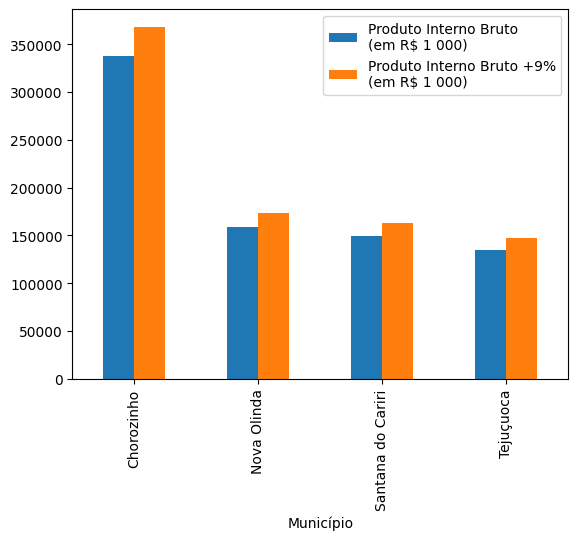

In [ ]:
ax = filtered_new_pandas_df.plot(x='Município', y=['Produto Interno Bruto\n(em R$ 1 000)', 'Produto Interno Bruto +9%\n(em R$ 1 000)'], kind='bar')

In [ ]:
new_file_name = 'IBGE_2020_Pruduto_interno_bruto.xlsx'
new_pandas_df = pd.read_excel(new_file_name)

In [ ]:
municipios = ['Chorozinho', 'Nova Olinda', 'Tejuçuoca', 'Santana do Cariri']
filtered_new_pandas_df = new_pandas_df[new_pandas_df['Município'].isin(municipios) & (new_pandas_df['UF'] == 'CE')]

In [ ]:
filtered_new_pandas_df['Produto Interno Bruto\n(em R$ 1 000)'] = pd.to_numeric(filtered_new_pandas_df['Produto Interno Bruto\n(em R$ 1 000)'])


<ipython-input-79-5367480891b4>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_new_pandas_df['Produto Interno Bruto\n(em R$ 1 000)'] = pd.to_numeric(filtered_new_pandas_df['Produto Interno Bruto\n(em R$ 1 000)'])


In [ ]:
filtered_new_pandas_df['Ganho de 9%\nProduto Interno Bruto'] = filtered_new_pandas_df['Produto Interno Bruto\n(em R$ 1 000)'] * 0.09

<ipython-input-80-da5cf63bdd74>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_new_pandas_df['Ganho de 9%\nProduto Interno Bruto'] = filtered_new_pandas_df['Produto Interno Bruto\n(em R$ 1 000)'] * 0.09


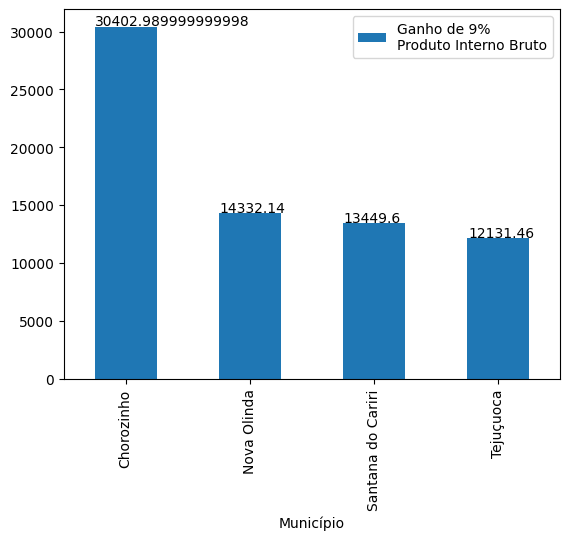

In [ ]:
ax = filtered_new_pandas_df.plot(x='Município', y='Ganho de 9%\nProduto Interno Bruto', kind='bar')
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

In [ ]:
total = filtered_new_pandas_df['Ganho de 9%\nProduto Interno Bruto'].sum()

Text(0, 35158.095, '70316.19')

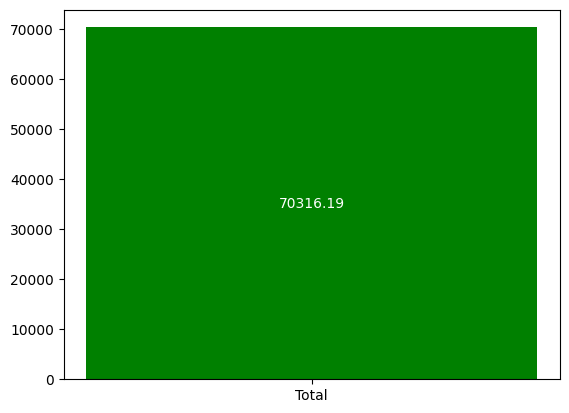

In [ ]:
ax = plt.bar(x=['Total'], height=[total], color='green')
plt.annotate(str(total), (0, total/2), ha='center', va='center', color='white')

In [ ]:
plt.show()